<a href="https://colab.research.google.com/github/abhishekjain6/Data-Uagmentation-using-GAN-s/blob/main/my_gan_notebooks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow.keras
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, LeakyReLU, Reshape, Flatten, Input
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Conv2DTranspose
from tensorflow.compat.v1.keras.layers import BatchNormalization
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np

In [2]:
pip install kaggle

In [3]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download soumikrakshit/anime-faces

100% 439M/441M [00:03<00:00, 149MB/s]
100% 441M/441M [00:03<00:00, 128MB/s]


In [4]:
!unzip anime-faces.zip

Streaming output truncated to the last 5000 lines.
  inflating: data/data/5499.png      
  inflating: data/data/55.png        
  inflating: data/data/550.png       
  inflating: data/data/5500.png      
  inflating: data/data/5501.png      
  inflating: data/data/5502.png      
  inflating: data/data/5503.png      
  inflating: data/data/5504.png      
  inflating: data/data/5505.png      
  inflating: data/data/5506.png      
  inflating: data/data/5507.png      
  inflating: data/data/5508.png      
  inflating: data/data/5509.png      
  inflating: data/data/551.png       
  inflating: data/data/5510.png      
  inflating: data/data/5511.png      
  inflating: data/data/5512.png      
  inflating: data/data/5513.png      
  inflating: data/data/5514.png      
  inflating: data/data/5515.png      
  inflating: data/data/5516.png      
  inflating: data/data/5517.png      
  inflating: data/data/5518.png      
  inflating: data/data/5519.png      
  inflating: data/data/552.png       

In [6]:
images = []
labels = [] 
label = 0
imagePaths = os.listdir("/content/data/data")

for path in imagePaths:
        image = cv2.imread("/content/data/data/"+path) 
        if image is not None:
            image = cv2.resize(image,(64,64)) #Resizing the image, in case some are not of the same size
    
            images.append(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

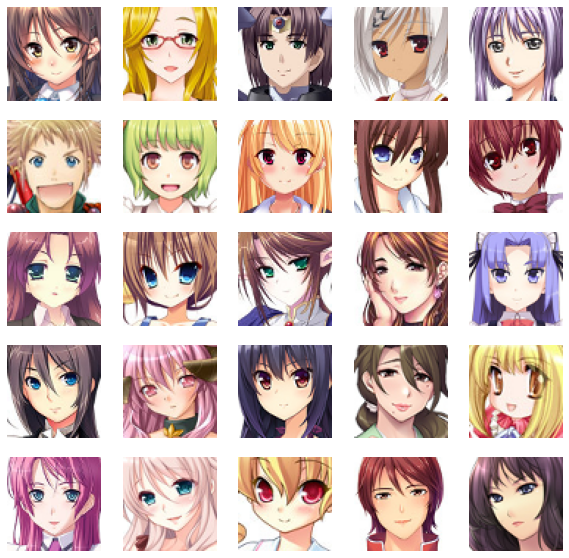

In [7]:
import random
fig,axis=plt.subplots(5,5,figsize=(10,10))
for x in range(5):
    for y in range(5):
        axis[x,y].imshow(images[10*x+y])
        axis[x,y].axis("off")
        

In [8]:
def generator():
    epsilon=10**(-5)
    initializer=tensorflow.keras.initializers.TruncatedNormal(stddev=0.02)
    
    
    model=Sequential()
    
    
    model.add(Dense(4*4*512,activation="linear",input_shape=(100,)))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((4, 4, 512)))
    
    model.add(Conv2DTranspose(512, kernel_size=[4,4], strides=[2,2], padding="same",kernel_initializer= initializer))
    model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2DTranspose(256, kernel_size=[4,4], strides=[2,2], padding="same",kernel_initializer= initializer))
    model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2DTranspose(128, kernel_size=[4,4], strides=[2,2], padding="same",kernel_initializer= initializer))
    model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2DTranspose(64, kernel_size=[4,4], strides=[2,2], padding="same", kernel_initializer= initializer))
    model.add(BatchNormalization(momentum=0.9, epsilon=epsilon))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2DTranspose(3, kernel_size=[4,4], strides=[1,1], padding="same", kernel_initializer= initializer))

    
    model.add(Activation("tanh"))
    
    
    noise = Input(shape=(100,))
    img = model(noise)

    return Model(noise, img)


In [9]:
def discriminator():
    model=Sequential()
    
    model.add(Conv2D(128, (3,3), padding='same', input_shape=(64,64,3)))
    model.add(LeakyReLU(alpha=0.18))
    model.add(BatchNormalization())
    
    
    model.add(Conv2D(128, (3,3), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(3,3)))
    model.add(Dropout(0.2))

    model.add(Conv2D(128, (3,3), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization())
    
    
    model.add(Conv2D(128, (3,3), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(3,3)))
    model.add(Dropout(0.3))

    model.add(Flatten())
    model.add(Dense(128))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(128))
    model.add(LeakyReLU(alpha=0.2))
    
    
    model.add(Dense(1, activation='sigmoid'))

    

    img = Input(shape=(64,64,3))
    validity = model(img)

    return Model(img, validity)

In [10]:
trainX=np.array(images)
trainX= (trainX.astype(np.float32)-127.5)/127.5
batch_size=128
half_batch=batch_size//2
disc_loss=[0,0]
generator_loss=0.00
num_epochs=13001


discriminator_=discriminator()
discriminator_.compile(loss='binary_crossentropy',optimizer=Adam(0.0002,0.5),metrics=['accuracy'])

generator_=generator()
generator_.compile(loss='binary_crossentropy', optimizer=Adam(0.0002,0.5))

complete=Sequential()
complete.add(generator_)
complete.add(discriminator_)
discriminator_.trainable=False
complete.compile(loss='binary_crossentropy', optimizer=Adam(0.0002,0.5))
losses=[]
accuracies=[]

Discriminator Loss: 0.10535118341445923
Generator Loss: 0.004976598620414734
Accuracy: 0.0034375 after epoch 0


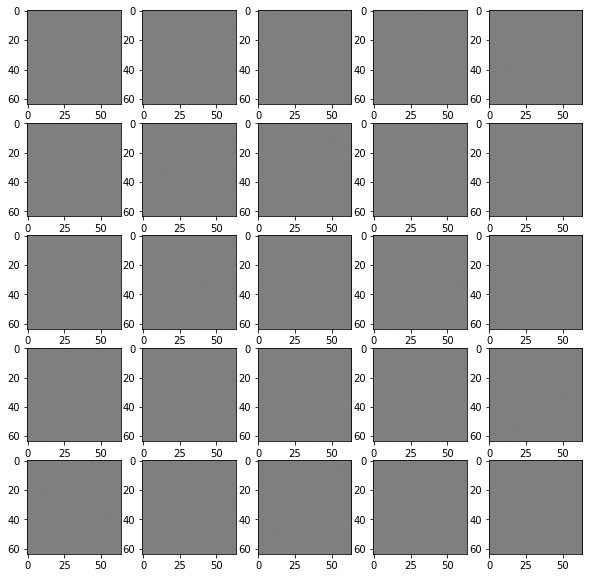

Discriminator Loss: 0.22974774258000252
Generator Loss: 2.0672984588798133
Accuracy: 0.9515625 after epoch 50
Discriminator Loss: 0.2717563303746283
Generator Loss: 2.475610835850239
Accuracy: 0.8915625 after epoch 100
Discriminator Loss: 0.2186518593574874
Generator Loss: 2.293040879890323
Accuracy: 0.92171875 after epoch 150
Discriminator Loss: 0.21414329356513917
Generator Loss: 2.594834552407265
Accuracy: 0.92515625 after epoch 200
Discriminator Loss: 0.28975044868828265
Generator Loss: 1.8650424093008042
Accuracy: 0.89 after epoch 250
Discriminator Loss: 0.3719745709979907
Generator Loss: 2.588096001148224
Accuracy: 0.85265625 after epoch 300
Discriminator Loss: 0.3420681637246162
Generator Loss: 3.4478459894657134
Accuracy: 0.854375 after epoch 350
Discriminator Loss: 0.388680551443249
Generator Loss: 3.2254310917854307
Accuracy: 0.83046875 after epoch 400
Discriminator Loss: 0.36648068703711034
Generator Loss: 2.8840803337097167
Accuracy: 0.85296875 after epoch 450
Discriminator

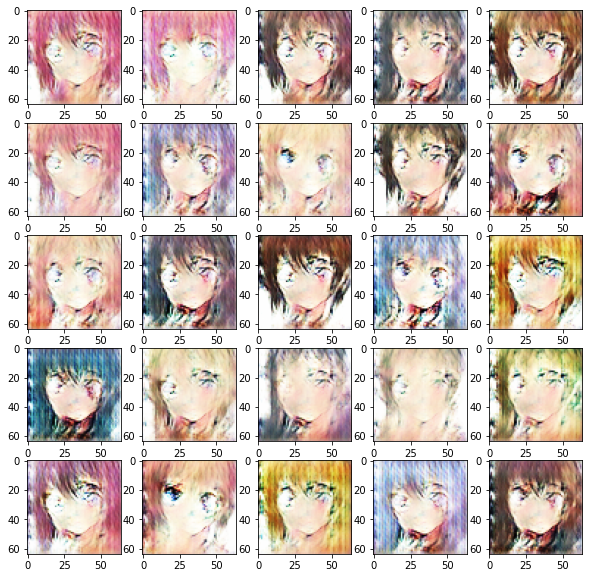

Discriminator Loss: 0.3454595805890858
Generator Loss: 4.0011630582809445
Accuracy: 0.85984375 after epoch 1050
Discriminator Loss: 0.32484342900104823
Generator Loss: 3.9546001768112182
Accuracy: 0.85625 after epoch 1100
Discriminator Loss: 0.305077149104327
Generator Loss: 4.049146265983581
Accuracy: 0.8753125 after epoch 1150
Discriminator Loss: 0.29672257049009204
Generator Loss: 3.941754741668701
Accuracy: 0.8765625 after epoch 1200
Discriminator Loss: 0.24417285727802665
Generator Loss: 3.384192183613777
Accuracy: 0.9028125 after epoch 1250
Discriminator Loss: 0.23571429755538703
Generator Loss: 4.266648182868957
Accuracy: 0.90375 after epoch 1300
Discriminator Loss: 0.2963393528759479
Generator Loss: 3.9659009695053102
Accuracy: 0.8734375 after epoch 1350
Discriminator Loss: 0.2616725028119981
Generator Loss: 3.9834065866470336
Accuracy: 0.89515625 after epoch 1400
Discriminator Loss: 0.2932926345989108
Generator Loss: 4.011259179115296
Accuracy: 0.87609375 after epoch 1450
Disc

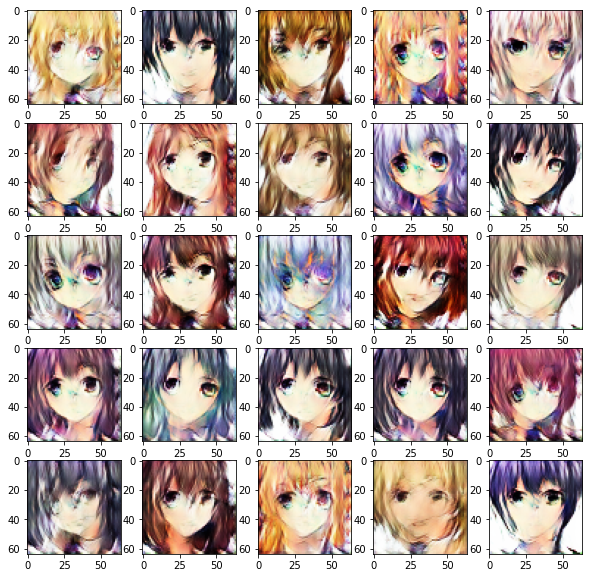

Discriminator Loss: 0.30687987715005877
Generator Loss: 3.7347570657730103
Accuracy: 0.8728125 after epoch 2050
Discriminator Loss: 0.3231937775574625
Generator Loss: 3.91503698348999
Accuracy: 0.86671875 after epoch 2100
Discriminator Loss: 0.3163709745183587
Generator Loss: 3.8447152471542356
Accuracy: 0.86890625 after epoch 2150
Discriminator Loss: 0.2576258097961545
Generator Loss: 3.803173794746399
Accuracy: 0.8934375 after epoch 2200
Discriminator Loss: 0.33086884509772063
Generator Loss: 3.7029928731918336
Accuracy: 0.86578125 after epoch 2250
Discriminator Loss: 0.3342364489659667
Generator Loss: 3.3890410017967225
Accuracy: 0.86171875 after epoch 2300
Discriminator Loss: 0.32365847542881965
Generator Loss: 3.544374580383301
Accuracy: 0.8603125 after epoch 2350
Discriminator Loss: 0.33159539341926575
Generator Loss: 3.6059389209747312
Accuracy: 0.8578125 after epoch 2400
Discriminator Loss: 0.3152280418202281
Generator Loss: 3.7727108573913575
Accuracy: 0.86421875 after epoch 2

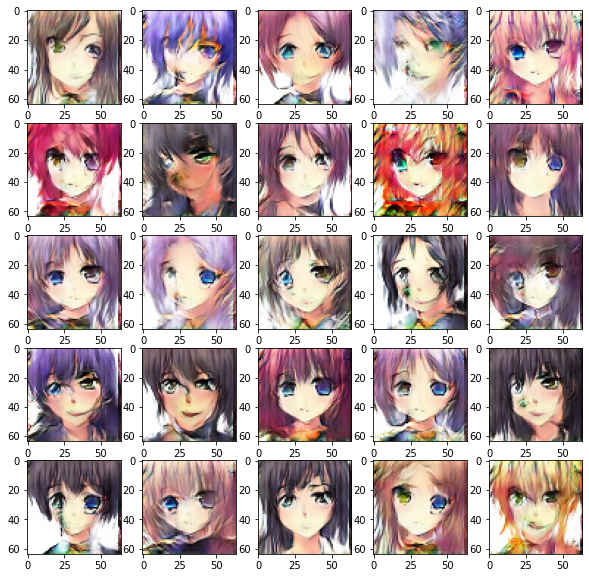

Discriminator Loss: 0.3031697142124176
Generator Loss: 3.5065189838409423
Accuracy: 0.86953125 after epoch 3050
Discriminator Loss: 0.31353232480585574
Generator Loss: 3.5840833950042725
Accuracy: 0.8665625 after epoch 3100
Discriminator Loss: 0.27942116387188437
Generator Loss: 3.750652346611023
Accuracy: 0.8828125 after epoch 3150
Discriminator Loss: 0.2772730464860797
Generator Loss: 3.6703521633148193
Accuracy: 0.888125 after epoch 3200
Discriminator Loss: 0.29022800898179413
Generator Loss: 3.7651975536346436
Accuracy: 0.8734375 after epoch 3250
Discriminator Loss: 0.3319199804216623
Generator Loss: 3.722160396575928
Accuracy: 0.85671875 after epoch 3300
Discriminator Loss: 0.2746309695020318
Generator Loss: 3.74026656627655
Accuracy: 0.881875 after epoch 3350
Discriminator Loss: 0.3130134628340602
Generator Loss: 3.8560550737380983
Accuracy: 0.87046875 after epoch 3400
Discriminator Loss: 0.36503647200763223
Generator Loss: 3.467320432662964
Accuracy: 0.850625 after epoch 3450
Di

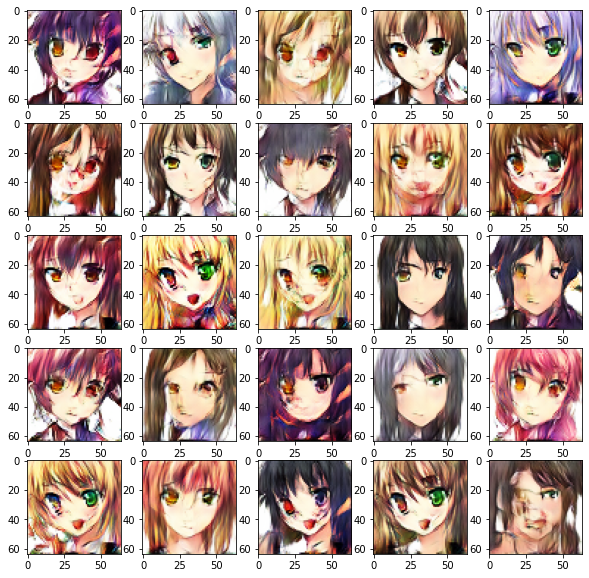

Discriminator Loss: 0.2968224173039198
Generator Loss: 3.6675534772872926
Accuracy: 0.86859375 after epoch 4050
Discriminator Loss: 0.29569399617612363
Generator Loss: 3.758194007873535
Accuracy: 0.88 after epoch 4100
Discriminator Loss: 0.2840866634622216
Generator Loss: 3.4706629657745363
Accuracy: 0.8828125 after epoch 4150
Discriminator Loss: 0.30843304987996817
Generator Loss: 3.6505921506881713
Accuracy: 0.8653125 after epoch 4200
Discriminator Loss: 0.32454722560942173
Generator Loss: 3.823477897644043
Accuracy: 0.86 after epoch 4250
Discriminator Loss: 0.30114565514028074
Generator Loss: 3.8554723596572877
Accuracy: 0.8709375 after epoch 4300
Discriminator Loss: 0.2861790965870023
Generator Loss: 3.720128769874573
Accuracy: 0.8728125 after epoch 4350
Discriminator Loss: 0.2861002717539668
Generator Loss: 3.857687520980835
Accuracy: 0.880625 after epoch 4400
Discriminator Loss: 0.31557714521884916
Generator Loss: 3.6691133260726927
Accuracy: 0.86171875 after epoch 4450
Discrimin

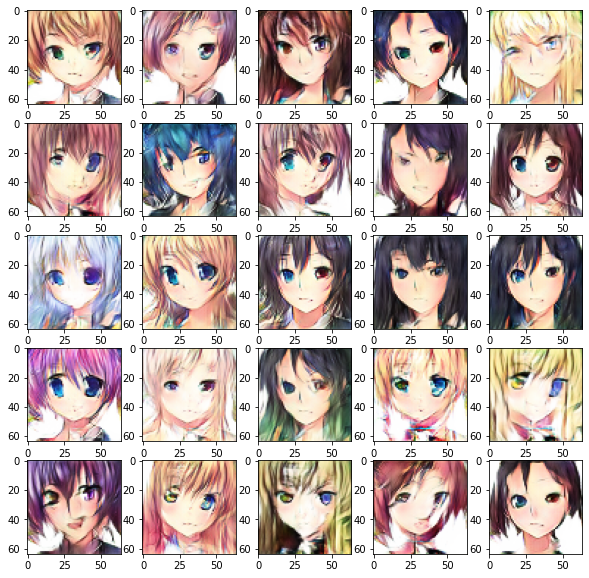

Discriminator Loss: 0.2805435682833195
Generator Loss: 3.899027442932129
Accuracy: 0.879375 after epoch 5050
Discriminator Loss: 0.31133252669125794
Generator Loss: 3.9805622911453247
Accuracy: 0.8646875 after epoch 5100
Discriminator Loss: 0.28560824211686847
Generator Loss: 3.9551184606552123
Accuracy: 0.8759375 after epoch 5150
Discriminator Loss: 0.2782495215535164
Generator Loss: 4.148078832626343
Accuracy: 0.8828125 after epoch 5200
Discriminator Loss: 0.28222927890717986
Generator Loss: 4.002824277877807
Accuracy: 0.8825 after epoch 5250
Discriminator Loss: 0.2884730413556099
Generator Loss: 4.029890804290772
Accuracy: 0.87671875 after epoch 5300
Discriminator Loss: 0.2976688441634178
Generator Loss: 4.057442035675049
Accuracy: 0.8728125 after epoch 5350
Discriminator Loss: 0.2895507151260972
Generator Loss: 3.9907279062271117
Accuracy: 0.87453125 after epoch 5400
Discriminator Loss: 0.2749464673362672
Generator Loss: 4.026626386642456
Accuracy: 0.88265625 after epoch 5450
Discr

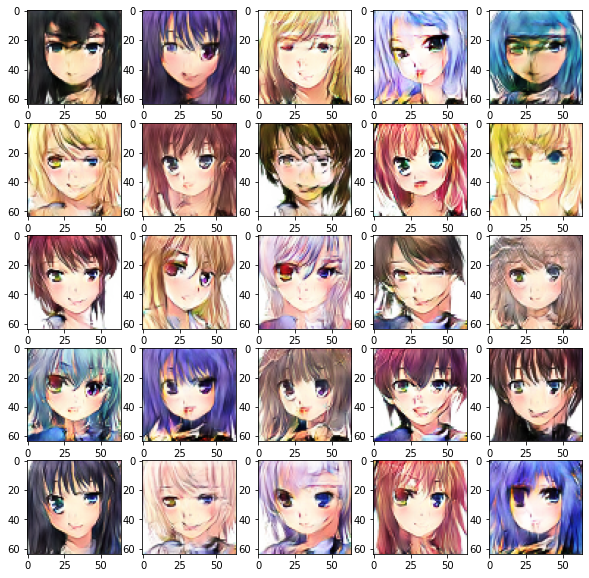

Discriminator Loss: 0.2567743725702167
Generator Loss: 4.08212703704834
Accuracy: 0.8921875 after epoch 6050
Discriminator Loss: 0.27070482563227416
Generator Loss: 4.095987086296081
Accuracy: 0.8871875 after epoch 6100
Discriminator Loss: 0.2749595081433654
Generator Loss: 4.240027160644531
Accuracy: 0.88234375 after epoch 6150
Discriminator Loss: 0.2819197792559862
Generator Loss: 4.072043418884277
Accuracy: 0.88140625 after epoch 6200
Discriminator Loss: 0.27501076515764
Generator Loss: 4.096054019927979
Accuracy: 0.88234375 after epoch 6250
Discriminator Loss: 0.26997383873909714
Generator Loss: 4.0137135028839115
Accuracy: 0.88609375 after epoch 6300
Discriminator Loss: 0.24322973150759936
Generator Loss: 4.050251669883728
Accuracy: 0.90421875 after epoch 6350
Discriminator Loss: 0.28733009452931585
Generator Loss: 4.158790693283081
Accuracy: 0.878125 after epoch 6400
Discriminator Loss: 0.2788019448332488
Generator Loss: 3.906952600479126
Accuracy: 0.883125 after epoch 6450
Discr

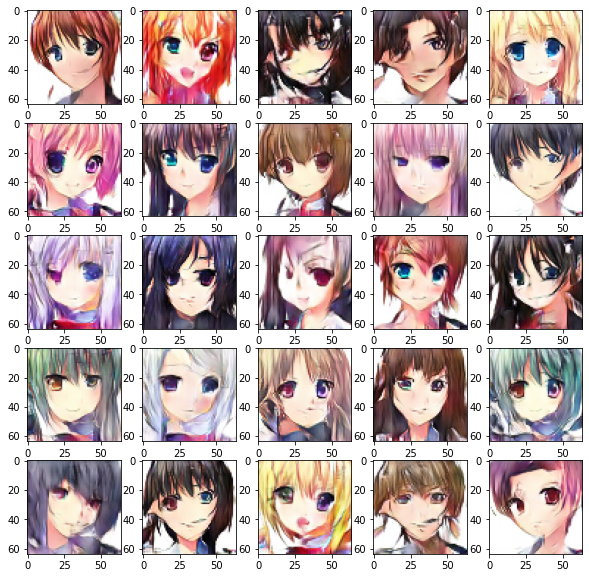

Discriminator Loss: 0.24409170558676124
Generator Loss: 4.469756240844727
Accuracy: 0.900625 after epoch 7050
Discriminator Loss: 0.23781304586678742
Generator Loss: 4.224063906669617
Accuracy: 0.90140625 after epoch 7100
Discriminator Loss: 0.2587074989452958
Generator Loss: 4.33817090511322
Accuracy: 0.8909375 after epoch 7150
Discriminator Loss: 0.2512319469451904
Generator Loss: 4.285637083053589
Accuracy: 0.8996875 after epoch 7200
Discriminator Loss: 0.2620667523518205
Generator Loss: 4.190601668357849
Accuracy: 0.8890625 after epoch 7250
Discriminator Loss: 0.2514852423220873
Generator Loss: 4.542239131927491
Accuracy: 0.89375 after epoch 7300
Discriminator Loss: 0.22374490808695555
Generator Loss: 4.434195852279663
Accuracy: 0.9075 after epoch 7350
Discriminator Loss: 0.287457517683506
Generator Loss: 4.4469785451889035
Accuracy: 0.88453125 after epoch 7400
Discriminator Loss: 0.24401550136506558
Generator Loss: 4.252206707000733
Accuracy: 0.89890625 after epoch 7450
Discrimina

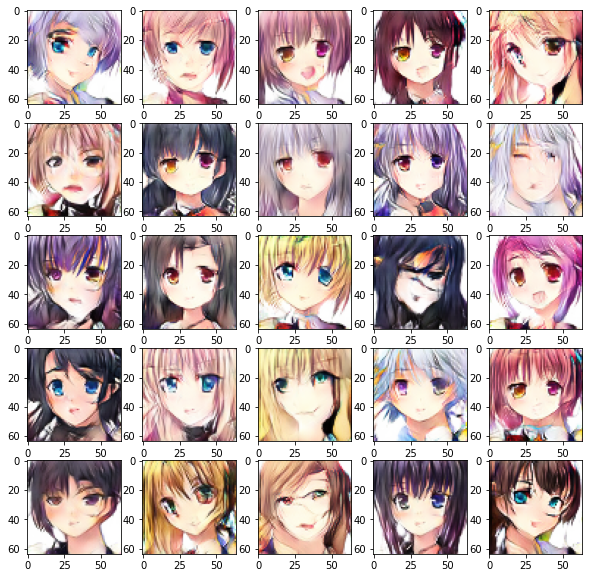

Discriminator Loss: 0.2382339210063219
Generator Loss: 4.665369067192078
Accuracy: 0.90234375 after epoch 8050
Discriminator Loss: 0.2608220639079809
Generator Loss: 4.40110182762146
Accuracy: 0.89484375 after epoch 8100
Discriminator Loss: 0.2633396407589316
Generator Loss: 4.551952738761901
Accuracy: 0.88828125 after epoch 8150
Discriminator Loss: 0.2413314137980342
Generator Loss: 4.503349051475525
Accuracy: 0.9021875 after epoch 8200
Discriminator Loss: 0.19713230416178704
Generator Loss: 4.547857327461243
Accuracy: 0.92171875 after epoch 8250
Discriminator Loss: 0.20413411570712925
Generator Loss: 4.74923999786377
Accuracy: 0.92078125 after epoch 8300
Discriminator Loss: 0.20468839827924967
Generator Loss: 4.783159098625183
Accuracy: 0.9209375 after epoch 8350
Discriminator Loss: 0.22712033960968256
Generator Loss: 4.713584518432617
Accuracy: 0.90453125 after epoch 8400
Discriminator Loss: 0.20079944977536798
Generator Loss: 4.520813355445862
Accuracy: 0.91640625 after epoch 8450


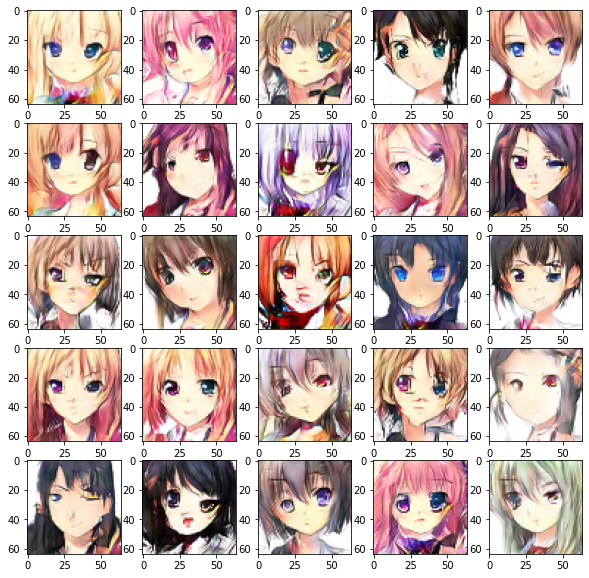

Discriminator Loss: 0.20245404679328202
Generator Loss: 4.747942562103272
Accuracy: 0.9171875 after epoch 9050
Discriminator Loss: 0.21443254290148617
Generator Loss: 4.828386807441712
Accuracy: 0.9153125 after epoch 9100
Discriminator Loss: 0.19664112973958253
Generator Loss: 4.796409592628479
Accuracy: 0.92078125 after epoch 9150
Discriminator Loss: 0.18680596889927983
Generator Loss: 4.794384517669678
Accuracy: 0.93015625 after epoch 9200
Discriminator Loss: 0.23615803460590543
Generator Loss: 4.84827654838562
Accuracy: 0.90078125 after epoch 9250
Discriminator Loss: 0.22751166591420768
Generator Loss: 4.739168553352356
Accuracy: 0.9075 after epoch 9300
Discriminator Loss: 0.20127285989001392
Generator Loss: 4.690645136833191
Accuracy: 0.9165625 after epoch 9350
Discriminator Loss: 0.19027540422976016
Generator Loss: 4.750443592071533
Accuracy: 0.92375 after epoch 9400
Discriminator Loss: 0.22338017508387564
Generator Loss: 4.839082155227661
Accuracy: 0.90640625 after epoch 9450
Dis

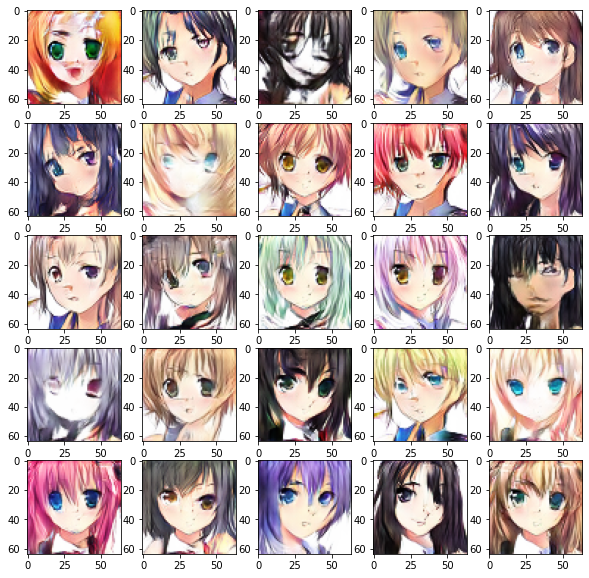

Discriminator Loss: 0.17570233047939837
Generator Loss: 5.02569088935852
Accuracy: 0.9303125 after epoch 10050
Discriminator Loss: 0.17135129141621291
Generator Loss: 5.153571977615356
Accuracy: 0.9315625 after epoch 10100
Discriminator Loss: 0.18986415905412288
Generator Loss: 5.144034581184387
Accuracy: 0.92609375 after epoch 10150
Discriminator Loss: 0.1749336870480329
Generator Loss: 5.158819656372071
Accuracy: 0.93234375 after epoch 10200
Discriminator Loss: 0.17455876181833446
Generator Loss: 5.186129703521728
Accuracy: 0.93328125 after epoch 10250
Discriminator Loss: 0.1913708235230297
Generator Loss: 5.292441258430481
Accuracy: 0.92 after epoch 10300
Discriminator Loss: 0.263170106865
Generator Loss: 5.150505337715149
Accuracy: 0.90359375 after epoch 10350
Discriminator Loss: 0.14096719978377223
Generator Loss: 4.7438601922988894
Accuracy: 0.94609375 after epoch 10400
Discriminator Loss: 0.16759734180755914
Generator Loss: 5.384291615486145
Accuracy: 0.93546875 after epoch 1045

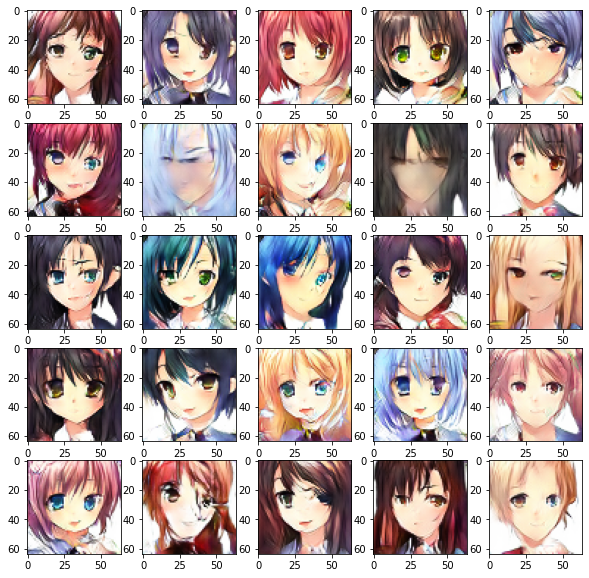

Discriminator Loss: 0.22592075856402516
Generator Loss: 4.936822142601013
Accuracy: 0.91734375 after epoch 11050
Discriminator Loss: 0.18551362304016947
Generator Loss: 5.264403686523438
Accuracy: 0.925625 after epoch 11100
Discriminator Loss: 0.17814132397994398
Generator Loss: 5.096034331321716
Accuracy: 0.92859375 after epoch 11150
Discriminator Loss: 0.1707898836117238
Generator Loss: 5.370164189338684
Accuracy: 0.93328125 after epoch 11200
Discriminator Loss: 0.1535693644825369
Generator Loss: 5.373615112304687
Accuracy: 0.9359375 after epoch 11250
Discriminator Loss: 0.18992873605340718
Generator Loss: 5.308963079452514
Accuracy: 0.92609375 after epoch 11300
Discriminator Loss: 0.190403551440686
Generator Loss: 5.300305042266846
Accuracy: 0.925 after epoch 11350
Discriminator Loss: 0.17466271180659532
Generator Loss: 5.188554663658142
Accuracy: 0.92796875 after epoch 11400
Discriminator Loss: 0.20373107471503318
Generator Loss: 5.290045213699341
Accuracy: 0.9209375 after epoch 11

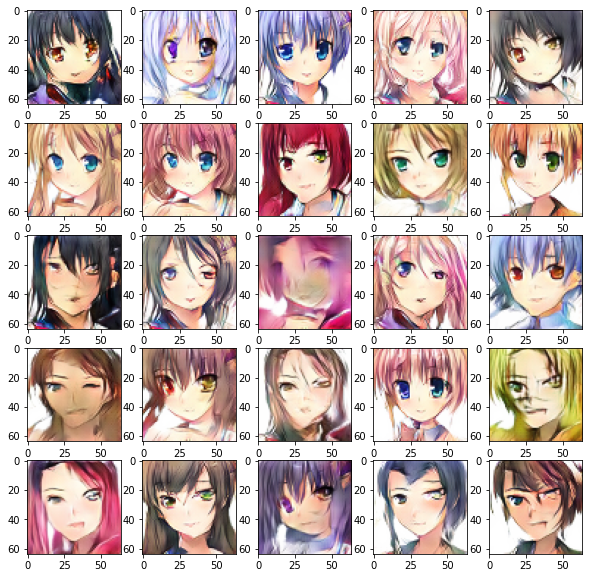

Discriminator Loss: 0.19799943218007685
Generator Loss: 5.298836560249328
Accuracy: 0.925 after epoch 12050
Discriminator Loss: 0.1987255043257028
Generator Loss: 5.08168044090271
Accuracy: 0.92171875 after epoch 12100
Discriminator Loss: 0.1924525266699493
Generator Loss: 5.052166080474853
Accuracy: 0.92828125 after epoch 12150
Discriminator Loss: 0.18017210838967002
Generator Loss: 4.970460271835327
Accuracy: 0.928125 after epoch 12200
Discriminator Loss: 0.15739881720393897
Generator Loss: 5.202338099479675
Accuracy: 0.93734375 after epoch 12250
Discriminator Loss: 0.18329103525727988
Generator Loss: 5.114250741004944
Accuracy: 0.924375 after epoch 12300
Discriminator Loss: 0.1563706969516352
Generator Loss: 5.408146648406983
Accuracy: 0.9378125 after epoch 12350
Discriminator Loss: 0.18447701523080468
Generator Loss: 5.63337043762207
Accuracy: 0.93453125 after epoch 12400
Discriminator Loss: 0.27101479831151665
Generator Loss: 4.284546446800232
Accuracy: 0.9103125 after epoch 12450

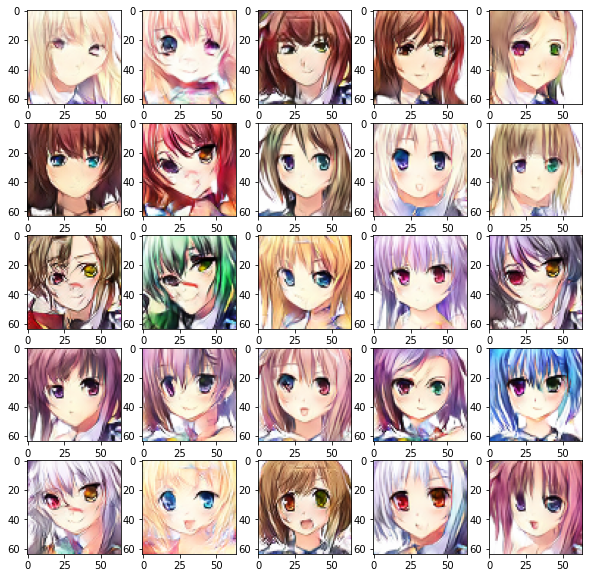

In [11]:
for epoch in range(num_epochs):
    cur_idx=np.random.randint(0, trainX.shape[0], half_batch)
    imgs = trainX[cur_idx]
    noise = np.random.normal(0, 1, (half_batch, 100))
    generated = generator_.predict(noise)
    
    disc_loss_current_epoch = 0.5 * np.add(discriminator_.train_on_batch(imgs, np.ones((half_batch, 1))),discriminator_.train_on_batch(generated, np.zeros((half_batch, 1))))
    
    noise = np.random.normal(0, 1, (batch_size, 100))
    set_y = np.array([1] * batch_size)
    generator_loss_current_epoch = complete.train_on_batch(noise, set_y)
    disc_loss[0] += disc_loss_current_epoch[0]
    disc_loss[1] += disc_loss_current_epoch[1]
    generator_loss += generator_loss_current_epoch
    
    
    if epoch%50==0:
        print("Discriminator Loss: "+str(disc_loss[0]/50))
        print("Generator Loss: "+ str(generator_loss/50))
        print("Accuracy: "+str(disc_loss[1]/50)+" after epoch " +str(epoch))
        accuracies.append(disc_loss[1]/50)
        losses.append([disc_loss[0]/50,generator_loss/50])
        disc_loss=[0,0]
        generator_loss=0.00
    
    if epoch%1000==0:
        noise = np.random.normal(0, 1, (25, 100))
        generated = generator_.predict(noise)
        
        generated = 0.5*generated
        generated += 0.5

        fig, axis = plt.subplots(5,5, figsize = (10,10))

        for i in range(5):
            for j in range(5):
                axis[i,j].imshow(generated[5*i+j])
        plt.show()
        fig.savefig("generated_after_epoch_%d.png" % epoch)
        plt.close()

# New Section

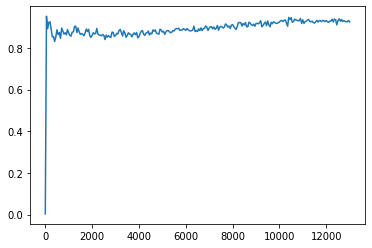

In [24]:
xaxis=[x for x in range(0,13001,50)]
losses1=[x[0] for x in losses ]
losses2=[x[1] for x in losses]
plt.plot(xaxis,accuracies)

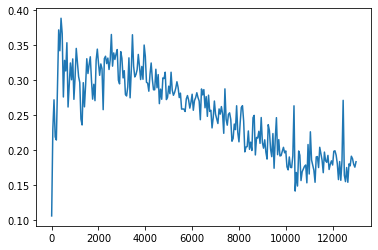

In [25]:
plt.plot(xaxis,losses1)

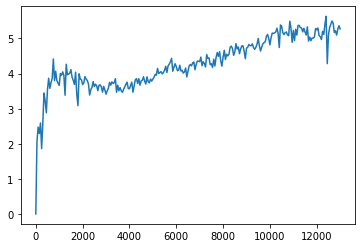

In [26]:
plt.plot(xaxis,losses2)